In [ ]:
!pip install adversarial-robustness-toolbox

     |████████████████████████████████| 1.1 MB 8.2 MB/s 
     |████████████████████████████████| 3.3 MB 48.6 MB/s 
     |████████████████████████████████| 26.3 MB 84.2 MB/s 
  Attempting uninstall: llvmlite
    Found existing installation: llvmlite 0.34.0
    Uninstalling llvmlite-0.34.0:
      Successfully uninstalled llvmlite-0.34.0
  Attempting uninstall: numba
    Found existing installation: numba 0.51.2
    Uninstalling numba-0.51.2:
      Successfully uninstalled numba-0.51.2


In [ ]:
!pip install sewar

  Created wheel for sewar: filename=sewar-0.4.4-py3-none-any.whl size=10390 sha256=f35007f7d0271d4bdb542d2dd82b66b735241f85f731e9353aed14ca1bf46032
  Stored in directory: /root/.cache/pip/wheels/b5/00/df/f1ba40d0d44c95b0db52804e518c128d5631866b91ea1960ba
Successfully built sewar


In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

import numpy as np
import matplotlib.pyplot as plt


import os
from art.estimators.classification import KerasClassifier
import art.utils
import  sklearn.metrics
import sklearn
import sewer
from art.attacks.extraction import *
from art.attacks.evasion import FastGradientMethod
from art.attacks.evasion import FastGradientMethod, ProjectedGradientDescent, DeepFool, CarliniL2Method,BrendelBethgeAttack
from art.attacks.evasion import BoundaryAttack
from sewar.full_ref import mse, rmse, psnr, uqi, ssim, ergas, scc, rase, sam, msssim, vifp
tf.compat.v1.disable_eager_execution()
#tf.enable_eager_execution()
#tf.compat.v1.enable_eager_execution()

#mpl.use('tkagg')

%matplotlib inline 
#import tensorflow_text

# from art.utils import load_dataset

In [ ]:
#  Load the CIFAR 10 dataset

# Original Dataset

(x_train, y_train), (x_test, y_test), min_, max_ = art.utils.load_dataset(str("cifar10")) 

print("x_train shape: " + str(x_train.shape) + "\n" + "x_train size: " + str(x_train.size))

print("y_train shape: " + str(y_train.shape) + "\n" + "x_train size: " + str(y_train.size))

print("x_test shape: " + str(x_test.shape) + "\n" + "x_train size: " + str(x_test.size))

print("y_test shape: " + str(y_test.shape) + "\n" + "x_train size: " + str(y_test.size))

x_train shape: (50000, 32, 32, 3)
x_train size: 153600000
y_train shape: (50000, 10)
x_train size: 500000
x_test shape: (10000, 32, 32, 3)
x_train size: 30720000
y_test shape: (10000, 10)
x_train size: 100000


In [ ]:
model_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
model = hub.KerasLayer(model_url, input_shape=(32, 32, 3))
victim_model = tf.keras.Sequential([
        model,
        tf.keras.layers.Activation('softmax')
])

victim_model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])
victim_model.summary()
victim_classifier = KerasClassifier(model=victim_model, clip_values=(0., 1.))

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 10)                7796426   
                                                                 
 activation_1 (Activation)   (None, 10)                0         
                                                                 
Total params: 7,796,426
Trainable params: 0
Non-trainable params: 7,796,426
_________________________________________________________________


In [ ]:
predictions = victim_classifier.predict(x_test) 
dependent_maxvalue = np.argmax(y_test, axis=1)
predict_maxvalue = np.argmax(predictions, axis=1)

# calculates the accuracy of the predictions
begin_example_accuracy = np.sum(predict_maxvalue == dependent_maxvalue) / len(y_test) 
acc_rate = begin_example_accuracy * 100

print("Accuracy for classifier on original test set: {}%\n".format(acc_rate))

/usr/local/lib/python3.7/dist-packages/keras/engine/training_v1.py:2079: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Accuracy for classifier on original test set: 94.52000000000001%



In [ ]:
# Craft adversarial samples with FGSM
epsilon = 0.1  # Maximum perturbation
adv_crafter = FastGradientMethod(victim_classifier, eps=epsilon)
x_test_adv = adv_crafter.generate(x=x_test)

# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_test_adv), axis=1)
acc = np.sum(preds == np.argmax(y_test, axis=1)) / y_test.shape[0]
print("\n Accuracy of classifier on test set for FGSM attack: %.2f%%" % (acc * 100))


 Accuracy of classifier on test set for FGSM attack: 13.16%


In [ ]:
# make a subset of test data
idx = np.arange(len(x_test))
subset_x_test = []
subset_y_test = []
y_label = np.where(y_test > 0)[1]
for i in range(10):
    mask = y_label == i
    subset_y_test.append(y_test[mask][10:20])
    subset_x_test.append(x_test[mask][10:20])

subset_x_test = np.concatenate(subset_x_test,axis=0)
subset_y_test = np.concatenate(subset_y_test,axis=0)

In [ ]:
#from collections import Counter
#print(Counter(list(subset_y_test)))
type(subset_y_test)
subset_y_test.shape

(100, 10)

Subset of Original Test Images


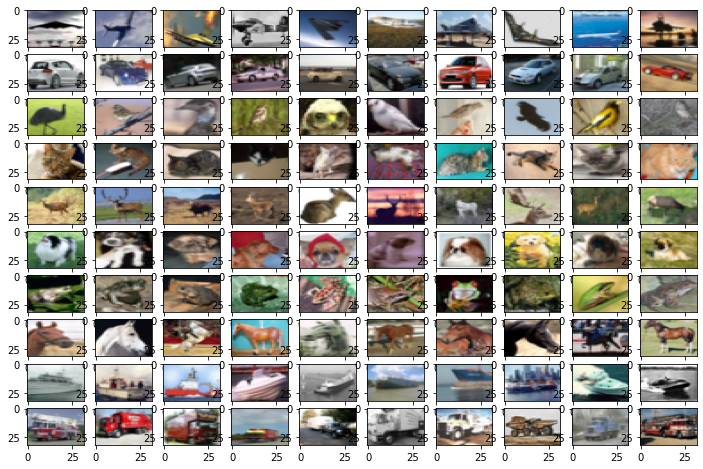

In [ ]:
# visualize data by plotting images
print("Subset of Original Test Images")
fig, ax = plt.subplots(10, 10, figsize=(12,8))
k = 0
for i in range(10):
    for j in range(10):
        ax[i][j].imshow(subset_x_test[k], aspect='auto')
        k += 1
plt.show()

In [ ]:
# accuracy on original subset of test set

predictions = victim_classifier.predict(subset_x_test) 
dependent_maxvalue = np.argmax(subset_y_test, axis=1)
predict_maxvalue = np.argmax(predictions, axis=1)

# calculates the accuracy of the predictions
begin_example_accuracy = np.sum(predict_maxvalue == dependent_maxvalue) / len(subset_y_test) 
acc_rate = begin_example_accuracy * 100

print("Accuracy for classifier on original subset of test set: {}%\n".format(acc_rate))

Accuracy for classifier on original subset of test set: 97.0%



In [ ]:
print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,predict_maxvalue))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,predict_maxvalue, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,predict_maxvalue, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,predict_maxvalue, average='weighted'))

accuracy 0.97
precision 0.9697979797979798
recall 0.97
f1-score 0.9694486215538848


In [ ]:
sklearn.metrics.accuracy_score(dependent_maxvalue,predict_maxvalue)

0.97

#FGSM

In [ ]:
import time
# FGSM attack on subset of test set
# Craft adversarial samples with FGSM
epsilon = 0.1  # Maximum perturbation
adv_crafter_fgsm = FastGradientMethod(victim_classifier, eps=epsilon)

start = time.time()
x_sub_test_adv_fgsm = adv_crafter_fgsm.generate(x=subset_x_test)
end = time.time()
print ("Time elapsed in seconds to generate FGSM adversarial inputs:", end - start)

# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_sub_test_adv_fgsm), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of classifier on subset of test set for FGSM attack: %.2f%%" % (acc * 100))

Time elapsed in seconds to generate FGSM adversarial inputs: 0.26483631134033203

 Accuracy of classifier on subset of test set for FGSM attack: 14.00%


robustness

In [ ]:
from art.metrics.metrics import empirical_robustness

emp_robust = empirical_robustness(victim_classifier, subset_x_test, str("fgsm"))
print(emp_robust)

0.11292756933361774


F1 scores, Accuracy, Pression, Recall

In [ ]:
print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,preds))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,preds, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,preds, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,preds, average='weighted'))


accuracy 0.14
precision 0.0918611111111111
recall 0.14
f1-score 0.07576441102756892


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Subset of FGSM Perturb subset of Test Images


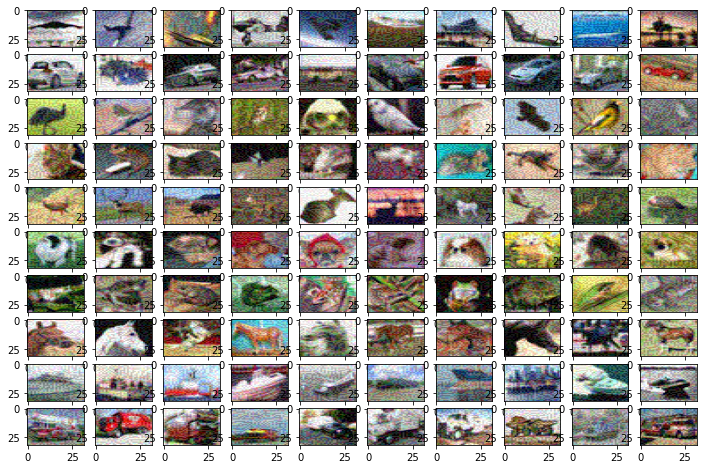

In [ ]:
# visulaize FGSM based perturb subset of test set
print("Subset of FGSM Perturb subset of Test Images")
fig, ax = plt.subplots(10, 10, figsize=(12,8))
k = 0
for i in range(10):
    for j in range(10):
        ax[i][j].imshow(x_sub_test_adv_fgsm[k], aspect='auto')
        k += 1
plt.show()

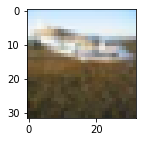

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])

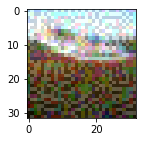

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_sub_test_adv_fgsm[5])

In [ ]:
ergas_score_fgsm = ergas(subset_x_test, x_sub_test_adv_fgsm)
mse_score_fgsm = mse(subset_x_test, x_sub_test_adv_fgsm)

print('ERGAS Score of FGSM', ergas_score_fgsm)
print('MSE Score of FGSM', mse_score_fgsm)

ERGAS Score of FGSM 30342.64665136283
MSE Score of FGSM 0.009582039867810007


/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float64 and float32
  warnings.warn(msg)


Bye FGSM

#ProjectedGradientDescent attack

In [ ]:
# ProjectedGradientDescent attack on subset of test set
adv_crafter_pgd = ProjectedGradientDescent(victim_classifier, norm=2)

start = time.time()
x_sub_test_adv_pgd = adv_crafter_pgd.generate(x=subset_x_test)
end = time.time()
print ("Time elapsed in seconds to generate PGD adversarial inputs:", end - start)


# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_sub_test_adv_pgd), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of classifier on subset of test set for ProjectedGradientDescent attack: %.2f%%" % (acc * 100))

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

Time elapsed in seconds to generate PGD adversarial inputs: 6.948186874389648

 Accuracy of classifier on subset of test set for ProjectedGradientDescent attack: 7.00%


In [ ]:
print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,preds))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,preds, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,preds, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,preds, average='weighted'))

accuracy 0.07
precision 0.09333333333333332
recall 0.07
f1-score 0.07782106782106782


In [ ]:
print('with norm=2 and everything else default the attack has 96% accuracy, which is min settings to make attack successful')

with norm=2 and everything else default the attack has 96% accuracy, which is min settings to make attack successful


ProjectedGradientDescent Perturbed Test Subset Images


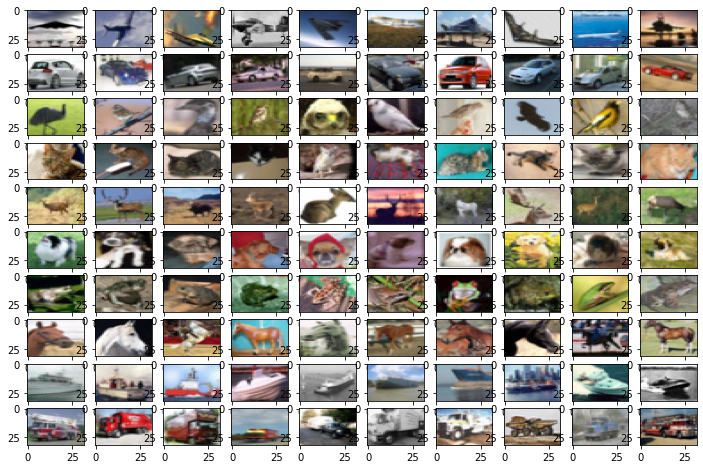

In [ ]:
#eps_step=0.1 and eps=0.3
#eps=0.00015 with all other default values has accury 96%, so its the min pertub 

# visulaize PGD based perturb subset of test set
print("ProjectedGradientDescent Perturbed Test Subset Images")
fig, ax = plt.subplots(10, 10, figsize=(12,8))
k = 0
for i in range(10):
    for j in range(10):
        ax[i][j].imshow(x_sub_test_adv_pgd[k], aspect='auto')
        k += 1
plt.show()

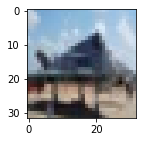

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_sub_test_adv_pgd[6])

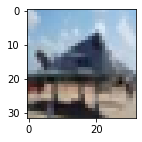

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[6])

In [ ]:
ergas_score_pgd = ergas(subset_x_test, x_sub_test_adv_pgd)
mse_score_pgd = mse(subset_x_test, x_sub_test_adv_pgd)

print('ERGAS Score of PGD', ergas_score_pgd)
print('MSE Score of PGD', mse_score_pgd)

ERGAS Score of PGD 1780.1499051591752
MSE Score of PGD 2.9296859945289913e-05


/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float64 and float32
  warnings.warn(msg)


end of PGD

#Deep Fool

In [ ]:
# DeepFool attack on subset of test set

adv_crafter_deepfool = DeepFool(victim_classifier, max_iter=100, verbose=False)

start = time.time()
x_sub_test_adv_deepfool = adv_crafter_deepfool.generate(x=subset_x_test)
end = time.time()
print ("Time elapsed in seconds to generate deepfool adversarial inputs:", end - start)

# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_sub_test_adv_deepfool), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for DeepFool Attack: %.2f%%" % (acc * 100))

Time elapsed in seconds to generate deepfool adversarial inputs: 17.36782741546631

 Accuracy of Classifier on Subset of Test Images for DeepFool Attack: 6.00%


In [ ]:
print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,preds))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,preds, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,preds, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,preds, average='weighted'))

accuracy 0.06
precision 0.0525
recall 0.06
f1-score 0.041678321678321674


DeepFool Perturbed Test Subset Images


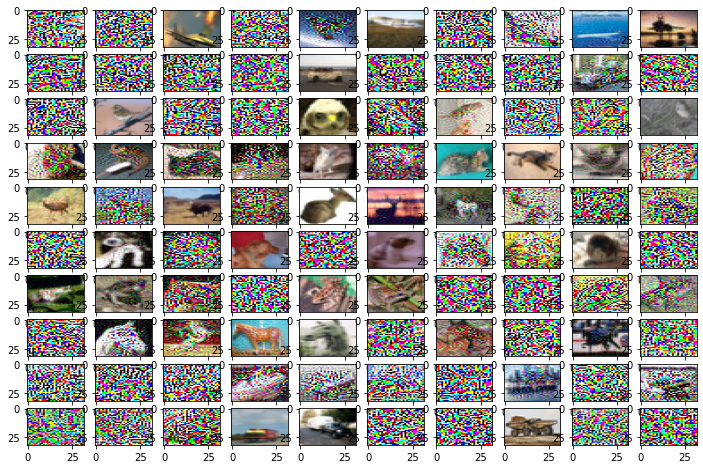

In [ ]:
# visulaize DeepFool based perturb subset of test set
print("DeepFool Perturbed Test Subset Images")
fig, ax = plt.subplots(10, 10, figsize=(12,8))
k = 0
for i in range(10):
    for j in range(10):
        ax[i][j].imshow(x_sub_test_adv_deepfool[k], aspect='auto')
        k += 1
plt.show()

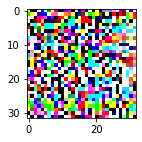

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_sub_test_adv_deepfool[5])

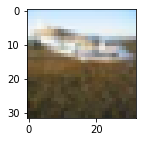

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])

In [ ]:
ergas_score_deepfool = ergas(subset_x_test, x_sub_test_adv_deepfool)
mse_score_deepfool = mse(subset_x_test, x_sub_test_adv_deepfool)

print('ERGAS Score of DeepFool', ergas_score_deepfool)
print('MSE Score of DeepFool', mse_score_deepfool)

ERGAS Score of DeepFool 112319.54899096212
MSE Score of DeepFool 0.13845384015234083


/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float64 and float32
  warnings.warn(msg)


bye deepFool

#hello CarliniL2Method Attacks

In [ ]:
# Carlini attack on subset of test set

adv_crafter_carlini = CarliniL2Method(victim_classifier, max_iter=1, verbose=False)
start = time.time()
x_sub_test_adv_carlini = adv_crafter_carlini.generate(x=subset_x_test)
end = time.time()
print ("Time elapsed in seconds to generate carliniL2method adversarial inputs:", end - start)


# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_sub_test_adv_carlini), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for CarliniL2Method Attack: %.2f%%" % (acc * 100))

Time elapsed in seconds to generate carliniL2method adversarial inputs: 48.971524238586426

 Accuracy of Classifier on Subset of Test Images for CarliniL2Method Attack: 79.00%


In [ ]:
print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,preds))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,preds, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,preds, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,preds, average='weighted'))

accuracy 0.79
precision 0.8064285714285714
recall 0.79
f1-score 0.7898573975044563


Carlini Perturbed Test Subset Images


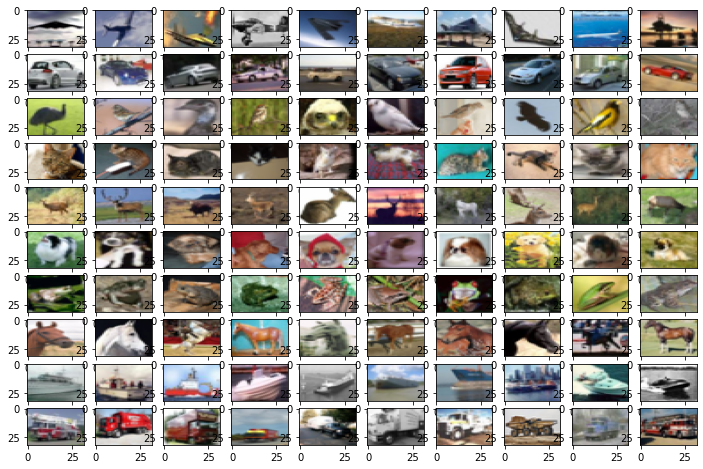

In [ ]:
# visulaize carlini based perturb subset of test set
print("Carlini Perturbed Test Subset Images")
fig, ax = plt.subplots(10, 10, figsize=(12,8))
k = 0
for i in range(10):
    for j in range(10):
        ax[i][j].imshow(x_sub_test_adv_carlini[k], aspect='auto')
        k += 1
plt.show()

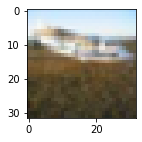

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_sub_test_adv_carlini[5])

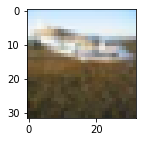

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])

In [ ]:
ergas_score_carlini = ergas(subset_x_test, x_sub_test_adv_carlini)
mse_score_carlini = mse(subset_x_test, x_sub_test_adv_carlini)

print('ERGAS Score of Carlini', ergas_score_carlini)
print('MSE Score of Carlini', mse_score_carlini)

ERGAS Score of Carlini 188.54045238166697
MSE Score of Carlini 5.480995174926651e-07


/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float64 and float32
  warnings.warn(msg)


bye CarliniL2Method Attacks

hello CarliniL0Method Attacks

bad CarliniL0Method Attacks

#Boundary Attack

In [ ]:
# boundary/decision attack on subset of test set

adv_crafter_decision = BoundaryAttack(victim_classifier, max_iter=1, verbose=False, targeted=False)
start = time.time()
x_sub_test_adv_decision = adv_crafter_decision.generate(x=subset_x_test)
end = time.time()
print ("Time elapsed in seconds to generate carliniL2method adversarial inputs:", end - start)


# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_sub_test_adv_decision), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for Decision/Boundary Attack: %.2f%%" % (acc * 100))

Time elapsed in seconds to generate carliniL2method adversarial inputs: 3.445849895477295

 Accuracy of Classifier on Subset of Test Images for Decision/Boundary Attack: 0.00%


In [ ]:
print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,preds))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,preds, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,preds, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,preds, average='weighted'))

accuracy 0.0
precision 0.0
recall 0.0
f1-score 0.0


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Decision Attack based Perturbed Test Subset Images


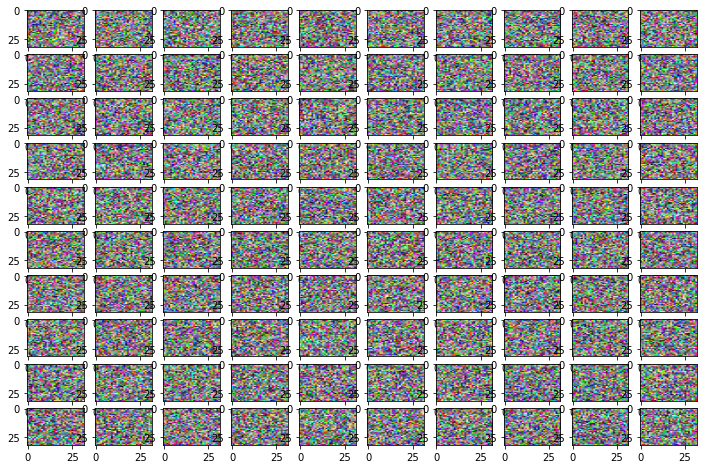

In [ ]:
# visulaize decision attack based perturb subset of test set
print("Decision Attack based Perturbed Test Subset Images")
fig, ax = plt.subplots(10, 10, figsize=(12,8))
k = 0
for i in range(10):
    for j in range(10):
        ax[i][j].imshow(x_sub_test_adv_decision[k], aspect='auto')
        k += 1
plt.show()

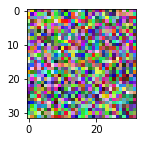

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_sub_test_adv_decision[5])

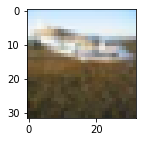

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])

In [ ]:
ergas_score_decision = ergas(subset_x_test, x_sub_test_adv_decision)
mse_score_decision = mse(subset_x_test, x_sub_test_adv_decision)

print('ERGAS Score of Decision Attack', ergas_score_decision)
print('MSE Score of Decision Attack', mse_score_decision)

ERGAS Score of Decision Attack 117357.70102347276
MSE Score of Decision Attack 0.14448874700576492


/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float64 and float32
  warnings.warn(msg)


#ElasticNet

In [ ]:
from art.attacks.evasion import ElasticNet

In [ ]:
ead = ElasticNet(classifier=victim_classifier, targeted=True, max_iter=1)

start = time.time()
x_test_adv_ead = ead.generate(x=subset_x_test,  y=subset_y_test)
end = time.time()
print ("Time elapsed in seconds to generate elasticNet adversarial inputs:", end - start)

EAD:   0%|          | 0/100 [00:00<?, ?it/s]

Time elapsed in seconds to generate elasticNet adversarial inputs: 20.248743772506714


In [ ]:
# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_test_adv_ead), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for ElasticNet Attack: %.2f%%" % (acc * 100))


 Accuracy of Classifier on Subset of Test Images for ElasticNet Attack: 99.00%


In [ ]:
# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_test_adv_ead), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for ElasticNet Attack: %.2f%%" % (acc * 100))


 Accuracy of Classifier on Subset of Test Images for ElasticNet Attack: 99.00%


In [ ]:
print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,preds))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,preds, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,preds, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,preds, average='weighted'))

accuracy 0.99
precision 0.990909090909091
recall 0.99
f1-score 0.9899749373433585


ElasticNet based Perturbed Test Subset Images


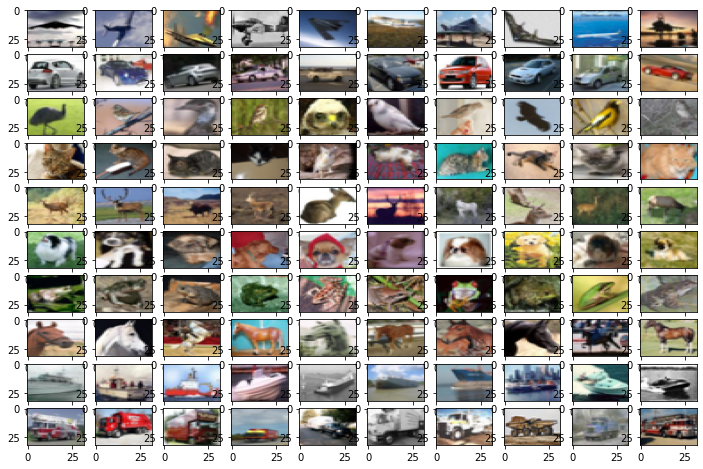

In [ ]:
# visulaize decision attack based perturb subset of test set
print("ElasticNet based Perturbed Test Subset Images")
fig, ax = plt.subplots(10, 10, figsize=(12,8))
k = 0
for i in range(10):
    for j in range(10):
        ax[i][j].imshow(x_test_adv_ead[k], aspect='auto')
        k += 1
plt.show()

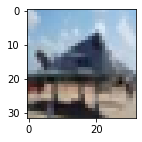

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_test_adv_ead[6])

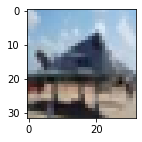

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[6])

In [ ]:
ergas_score_x_test_adv_ead = ergas(subset_x_test, x_test_adv_ead)
mse_score_x_test_adv_ead = mse(subset_x_test, x_test_adv_ead)

print('ERGAS Score of Elastic Attack', ergas_score_x_test_adv_ead)
print('MSE Score of Elastic Attack', mse_score_x_test_adv_ead)

ERGAS Score of Elastic Attack 12.702952635510796
MSE Score of Elastic Attack 1.3798502696289308e-08


/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float64 and float32
  warnings.warn(msg)


#FrameSaliencyAttack


In [ ]:
from art.attacks.evasion import FrameSaliencyAttack

In [ ]:
attacker = FastGradientMethod(victim_classifier, eps=1.0, batch_size=128)
attack_FrameSaliencyAttack = FrameSaliencyAttack(victim_classifier, attacker, "one_shot")
start = time.time()
x_adv_FrameSaliencyAttack = attack_FrameSaliencyAttack.generate(x=subset_x_test)
end = time.time()
print ("Time elapsed in seconds to generate frameSaliency adversarial inputs:", end - start)


# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_adv_FrameSaliencyAttack), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for FrameSaliencyAttack Attack: %.2f%%" % (acc * 100))

Time elapsed in seconds to generate frameSaliency adversarial inputs: 0.09191179275512695

 Accuracy of Classifier on Subset of Test Images for FrameSaliencyAttack Attack: 11.00%


In [ ]:
print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,preds))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,preds, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,preds, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,preds, average='weighted'))

accuracy 0.11
precision 0.03598901098901099
recall 0.11
f1-score 0.03408769448373409


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


FrameSaliencyAttack based Perturbed Test Subset Images


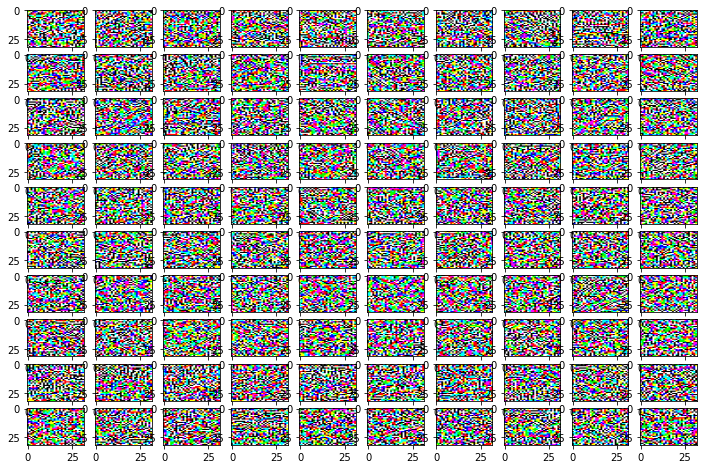

In [ ]:
# visulaize decision attack based perturb subset of test set
print("FrameSaliencyAttack based Perturbed Test Subset Images")
fig, ax = plt.subplots(10, 10, figsize=(12,8))
k = 0
for i in range(10):
    for j in range(10):
        ax[i][j].imshow(x_adv_FrameSaliencyAttack[k], aspect='auto')
        k += 1
plt.show()



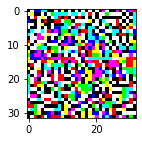

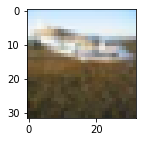

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_adv_FrameSaliencyAttack[5])

plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])


In [ ]:
ergas_score_x_test_adv_FrameSaliencyAttack = ergas(subset_x_test, x_adv_FrameSaliencyAttack)
mse_score_x_test_adv_FrameSaliencyAttack = mse(subset_x_test, x_adv_FrameSaliencyAttack)

print('ERGAS Score of FrameSaliencyAttack Attack', ergas_score_x_test_adv_FrameSaliencyAttack)
print('MSE Score of FrameSaliencyAttack Attack', mse_score_x_test_adv_FrameSaliencyAttack)

ERGAS Score of FrameSaliencyAttack Attack 173235.611119069
MSE Score of FrameSaliencyAttack Attack 0.31398350313981804


/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float64 and float32
  warnings.warn(msg)


#HopSkipJump (targeted)

In [ ]:
from art.attacks.evasion import HopSkipJump

In [ ]:
hsj = HopSkipJump(classifier=victim_classifier, targeted=True, max_iter=20, max_eval=100, init_eval=10, verbose=False)       

start = time.time()
x_test_adv_HopSkipJump = hsj.generate(x=subset_x_test, y=subset_y_test)
end = time.time()
print ("Time elapsed in seconds to generate frameSaliency adversarial inputs:", end - start)


# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_test_adv_HopSkipJump), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for HopSkipJump Attack: %.2f%%" % (acc * 100))

Time elapsed in seconds to generate frameSaliency adversarial inputs: 1.0932636260986328

 Accuracy of Classifier on Subset of Test Images for HopSkipJump Attack: 97.00%


In [ ]:
print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,preds))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,preds, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,preds, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,preds, average='weighted'))

accuracy 0.97
precision 0.9697979797979798
recall 0.97
f1-score 0.9694486215538848


FrameSaliencyAttack based Perturbed Test Subset Images


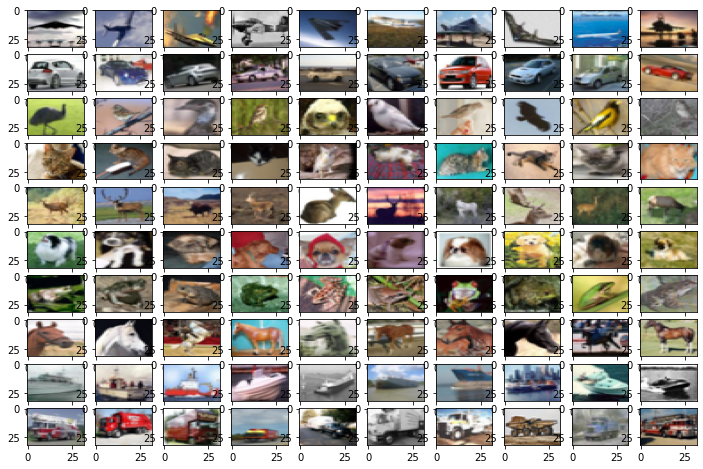

In [ ]:
# visulaize decision attack based perturb subset of test set
print("FrameSaliencyAttack based Perturbed Test Subset Images")
fig, ax = plt.subplots(10, 10, figsize=(12,8))
k = 0
for i in range(10):
    for j in range(10):
        ax[i][j].imshow(x_test_adv_HopSkipJump[k], aspect='auto')
        k += 1
plt.show()


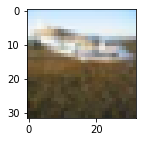

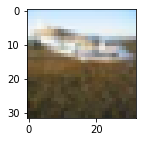

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_test_adv_HopSkipJump[5])
plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])


In [ ]:
ergas_score_x_test_x_test_adv_HopSkipJump = ergas(subset_x_test, x_test_adv_HopSkipJump)
mse_score_x_test_x_test_adv_HopSkipJump = mse(subset_x_test, x_test_adv_HopSkipJump)

print('ERGAS Score of HopSkipJump Attack', ergas_score_x_test_x_test_adv_HopSkipJump)
print('MSE Score of HopSkipJump Attack', mse_score_x_test_x_test_adv_HopSkipJump)

ERGAS Score of HopSkipJump Attack 0.004216156600044567
MSE Score of HopSkipJump Attack 1.944410691422944e-16


/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float64 and float32
  warnings.warn(msg)


#BasicIterativeMethod

In [ ]:
from art.attacks.evasion import BasicIterativeMethod

In [ ]:
attack_BasicIterativeMethod = BasicIterativeMethod(victim_classifier)
start = time.time()
x_train_adv_BasicIterativeMethod = attack_BasicIterativeMethod.generate(subset_x_test)
end = time.time()
print ("Time elapsed in seconds to generate frameSaliency adversarial inputs:", end - start)


# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_train_adv_BasicIterativeMethod), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for BasicIterativeMethod Attack: %.2f%%" % (acc * 100))

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

Time elapsed in seconds to generate frameSaliency adversarial inputs: 6.945320129394531

 Accuracy of Classifier on Subset of Test Images for BasicIterativeMethod Attack: 1.00%


In [ ]:
print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,preds))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,preds, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,preds, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,preds, average='weighted'))

accuracy 0.01
precision 0.0029411764705882353
recall 0.01
f1-score 0.004545454545454544


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


BasicIterativeMethod based Perturbed Test Subset Images


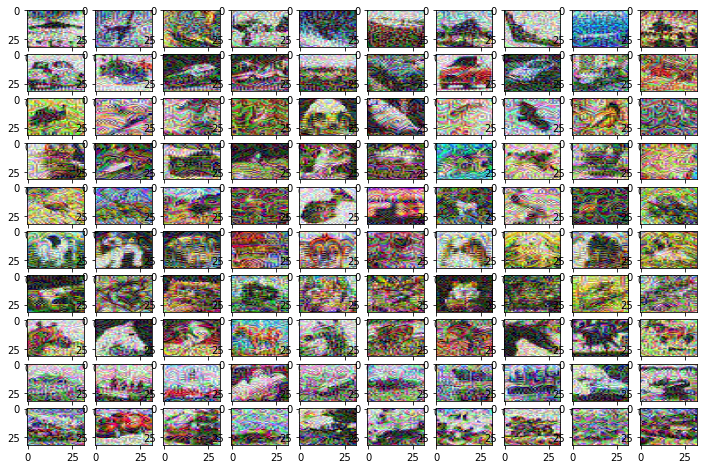

In [ ]:
# visulaize decision attack based perturb subset of test set
print("BasicIterativeMethod based Perturbed Test Subset Images")
fig, ax = plt.subplots(10, 10, figsize=(12,8))
k = 0
for i in range(10):
    for j in range(10):
        ax[i][j].imshow(x_train_adv_BasicIterativeMethod[k], aspect='auto')
        k += 1
plt.show()


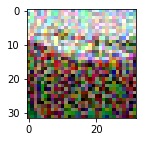

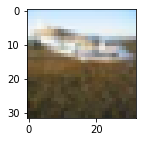

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_train_adv_BasicIterativeMethod[5])

plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])


In [ ]:
ergas_score_x_test_x_test_adv_BasicIterativeMethod = ergas(subset_x_test, x_train_adv_BasicIterativeMethod)
mse_score_x_test_x_test_adv_BasicIterativeMethod = mse(subset_x_test, x_train_adv_BasicIterativeMethod)

print('ERGAS Score of BasicIterativeMethod Attack', ergas_score_x_test_x_test_adv_BasicIterativeMethod)
print('MSE Score of BasicIterativeMethod Attack', mse_score_x_test_x_test_adv_BasicIterativeMethod)

ERGAS Score of BasicIterativeMethod Attack 61231.112476534036
MSE Score of BasicIterativeMethod Attack 0.03941858866701886


/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float64 and float32
  warnings.warn(msg)


#NewtonFool


In [ ]:
from art.attacks.evasion import NewtonFool

In [ ]:
nf = NewtonFool(victim_classifier, max_iter=5, verbose=False)
start = time.time()
x_test_adv_NewtonFool = nf.generate(subset_x_test)
end = time.time()
print ("Time elapsed in seconds to generate newtonfool adversarial inputs:", end - start)


# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_test_adv_NewtonFool), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for newtonfool Attack: %.2f%%" % (acc * 100))

Time elapsed in seconds to generate newtonfool adversarial inputs: 6.212788820266724

 Accuracy of Classifier on Subset of Test Images for newtonfool Attack: 7.00%


In [ ]:
print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,preds))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,preds, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,preds, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,preds, average='weighted'))

accuracy 0.07
precision 0.06148809523809524
recall 0.07
f1-score 0.06352564102564102


newtonfool based Perturbed Test Subset Images


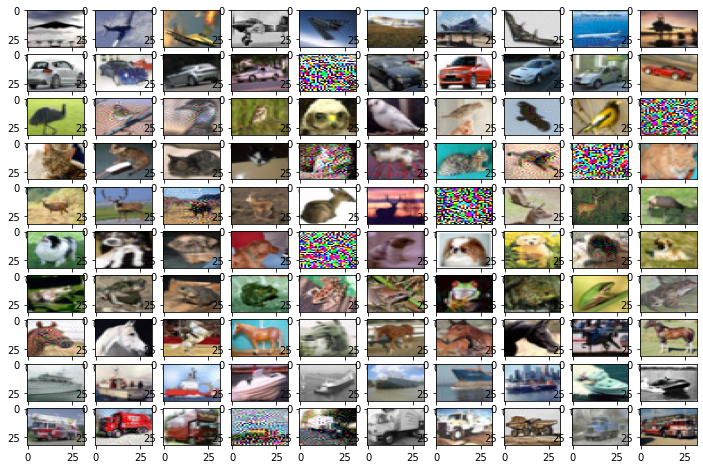

In [ ]:
# visulaize decision attack based perturb subset of test set
print("newtonfool based Perturbed Test Subset Images")
fig, ax = plt.subplots(10, 10, figsize=(12,8))
k = 0
for i in range(10):
    for j in range(10):
        ax[i][j].imshow(x_test_adv_NewtonFool[k], aspect='auto')
        k += 1
plt.show()

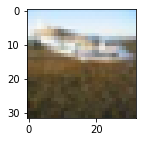

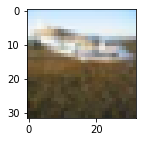

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_test_adv_NewtonFool[5])

plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])



In [ ]:
ergas_score_x_test_x_test_adv_newtonfool = ergas(subset_x_test, x_test_adv_NewtonFool)
mse_score_x_test_x_test_adv_newtonfool = mse(subset_x_test, x_test_adv_NewtonFool)

print('ERGAS Score of newtonfool Attack', ergas_score_x_test_x_test_adv_newtonfool)
print('MSE Score of newtonfool Attack', mse_score_x_test_x_test_adv_newtonfool)

ERGAS Score of newtonfool Attack 27447.396189891322
MSE Score of newtonfool Attack 0.01217624315646101


/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float64 and float32
  warnings.warn(msg)


#SaliencyMapMethod

In [ ]:
from art.attacks.evasion.saliency_map import SaliencyMapMethod

In [ ]:
df = SaliencyMapMethod(victim_classifier, theta=1, batch_size=100, verbose=False)
start = time.time()
x_test_adv_SaliencyMapMethod = df.generate(subset_x_test, subset_y_test)
end = time.time()
print ("Time elapsed in seconds to generate x_test_adv_ThresholdAttack adversarial inputs:", end - start)

# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_test_adv_SaliencyMapMethod), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for x_test_adv_ThresholdAttack Attack: %.2f%%" % (acc * 100))

print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,preds))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,preds, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,preds, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,preds, average='weighted'))

Time elapsed in seconds to generate x_test_adv_ThresholdAttack adversarial inputs: 0.7209348678588867

 Accuracy of Classifier on Subset of Test Images for x_test_adv_ThresholdAttack Attack: 100.00%
accuracy 1.0
precision 1.0
recall 1.0
f1-score 1.0


newtonfool based Perturbed Test Subset Images


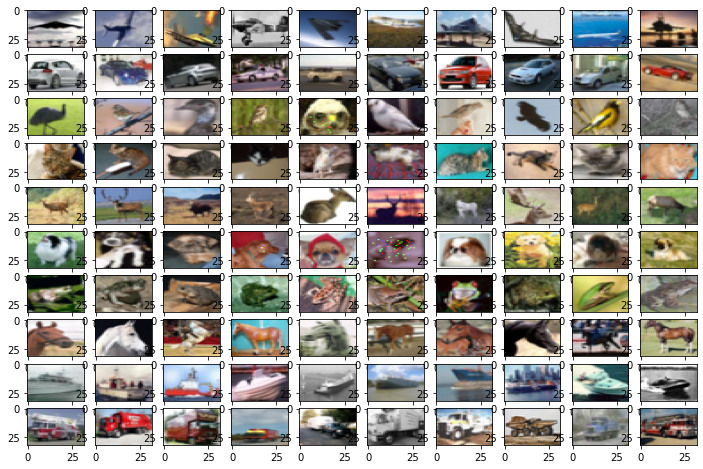

In [ ]:
# visulaize decision attack based perturb subset of test set
print("newtonfool based Perturbed Test Subset Images")
fig, ax = plt.subplots(10, 10, figsize=(12,8))
k = 0
for i in range(10):
    for j in range(10):
        ax[i][j].imshow(x_test_adv_SaliencyMapMethod[k], aspect='auto')
        k += 1
plt.show()

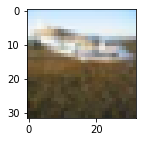

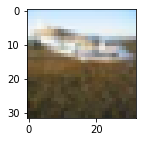

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_test_adv_SaliencyMapMethod[5])

plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])


newtonfool based Perturbed Test Subset Images


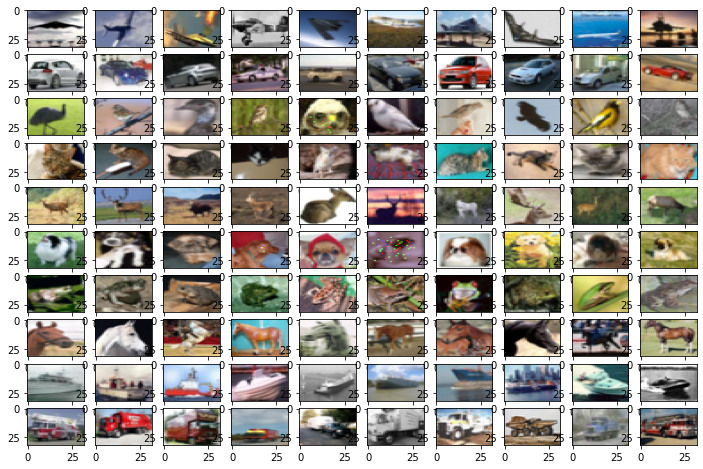

In [ ]:
# visulaize decision attack based perturb subset of test set
print("newtonfool based Perturbed Test Subset Images")
fig, ax = plt.subplots(10, 10, figsize=(12,8))
k = 0
for i in range(10):
    for j in range(10):
        ax[i][j].imshow(x_test_adv_SaliencyMapMethod[k], aspect='auto')
        k += 1
plt.show()

In [ ]:
ergas_score_x_test_x_test_adv_SaliencyMapMethod = ergas(subset_x_test, x_test_adv_SaliencyMapMethod)
mse_score_x_test_x_test_adv_SaliencyMapMethod = mse(subset_x_test, x_test_adv_SaliencyMapMethod)

print('ERGAS Score of newtonfool Attack', ergas_score_x_test_x_test_adv_SaliencyMapMethod)
print('MSE Score of newtonfool Attack', mse_score_x_test_x_test_adv_SaliencyMapMethod)

ERGAS Score of newtonfool Attack 1136.204007912392
MSE Score of newtonfool Attack 7.632881584025593e-05


/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float64 and float32
  warnings.warn(msg)


# SimBA


In [ ]:
from art.attacks.evasion.simba import SimBA

In [ ]:
df = SimBA(victim_classifier, attack="dct", targeted=False)
start = time.time()
x_test_adv_SimBA = df.generate(subset_x_test)
end = time.time()
print ("Time elapsed in seconds to generate SimBA adversarial inputs:", end - start)

# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_test_adv_SimBA), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for SimBA Attack: %.2f%%" % (acc * 100))

print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,preds))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,preds, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,preds, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,preds, average='weighted'))

Time elapsed in seconds to generate SimBA adversarial inputs: 97.15042901039124

 Accuracy of Classifier on Subset of Test Images for SimBA Attack: 96.00%
accuracy 0.96
precision 0.9616161616161617
recall 0.96
f1-score 0.9598997493734336


newtonfool based Perturbed Test Subset Images


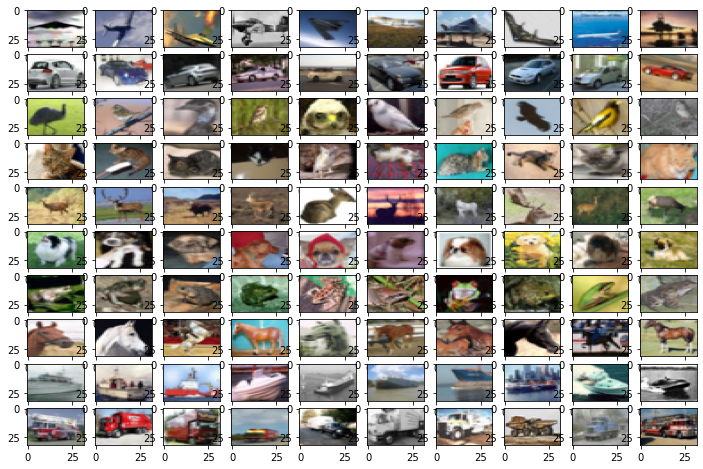

In [ ]:
# visulaize decision attack based perturb subset of test set
print("newtonfool based Perturbed Test Subset Images")
fig, ax = plt.subplots(10, 10, figsize=(12,8))
k = 0
for i in range(10):
    for j in range(10):
        ax[i][j].imshow(x_test_adv_SimBA[k], aspect='auto')
        k += 1
plt.show()

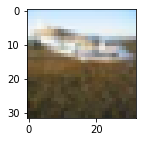

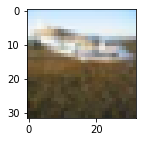

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_test_adv_SimBA[5])

plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])


In [ ]:
ergas_score_x_test_x_test_adv_HopSkipJump = ergas(subset_x_test, x_test_adv_SimBA)
mse_score_x_test_x_test_adv_HopSkipJump = mse(subset_x_test, x_test_adv_SimBA)

print('ERGAS Score of newtonfool Attack', ergas_score_x_test_x_test_adv_HopSkipJump)
print('MSE Score of newtonfool Attack', mse_score_x_test_x_test_adv_HopSkipJump)

ERGAS Score of newtonfool Attack 22.325910194399974
MSE Score of newtonfool Attack 4.529515812712182e-06


/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float64 and float32
  warnings.warn(msg)


#SpatialTransformation

In [ ]:
from art.attacks.evasion.spatial_transformation import SpatialTransformation

In [ ]:
attack_st = SpatialTransformation(
            victim_classifier, max_translation=10.0, num_translations=3, max_rotation=30.0, 
            num_rotations=3, verbose=False
        )
start = time.time()
x_train_adv_SpatialTransformation = attack_st.generate(subset_x_test)

end = time.time()
print ("Time elapsed in seconds to generate SimBA adversarial inputs:", end - start)

# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_train_adv_SpatialTransformation), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for SimBA Attack: %.2f%%" % (acc * 100))

print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,preds))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,preds, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,preds, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,preds, average='weighted'))

Time elapsed in seconds to generate SimBA adversarial inputs: 27.949256658554077

 Accuracy of Classifier on Subset of Test Images for SimBA Attack: 48.00%
accuracy 0.48
precision 0.546123136123136
recall 0.48
f1-score 0.46080838550343195


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


newtonfool based Perturbed Test Subset Images


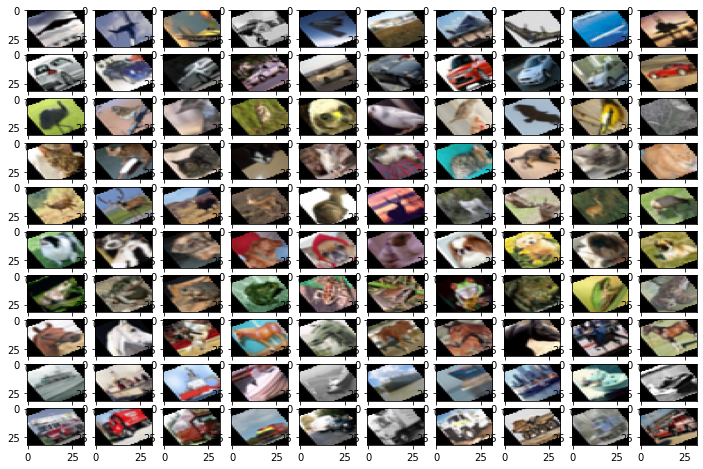

In [ ]:
# visulaize decision attack based perturb subset of test set
print("newtonfool based Perturbed Test Subset Images")
fig, ax = plt.subplots(10, 10, figsize=(12,8))
k = 0
for i in range(10):
    for j in range(10):
        ax[i][j].imshow(x_train_adv_SpatialTransformation[k], aspect='auto')
        k += 1
plt.show()

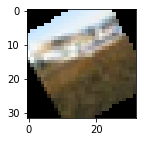

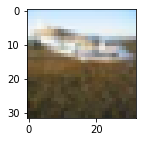

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_train_adv_SpatialTransformation[5])

plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])

In [ ]:
ergas_score_x_test_x_test_adv_SpatialTransformation = ergas(subset_x_test, x_train_adv_SpatialTransformation)
mse_score_x_test_x_test_adv_SpatialTransformation = mse(subset_x_test, x_train_adv_SpatialTransformation)

print('ERGAS Score of newtonfool Attack', ergas_score_x_test_x_test_adv_SpatialTransformation)
print('MSE Score of newtonfool Attack', mse_score_x_test_x_test_adv_SpatialTransformation)

ERGAS Score of newtonfool Attack 90432.42429807295
MSE Score of newtonfool Attack 0.1159686231827403


#SquareAttack


In [ ]:
from art.attacks.evasion import SquareAttack

In [ ]:
attack = SquareAttack(
            estimator=victim_classifier, norm=2, max_iter=5, eps=0.3, p_init=0.8, nb_restarts=1, verbose=False
        )
start = time.time()
x_train_mnist_adv_SquareAttack = attack.generate(x=subset_x_test, y=subset_y_test)
end = time.time()
print ("Time elapsed in seconds to generate SimBA adversarial inputs:", end - start)

# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_train_mnist_adv_SquareAttack), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for SimBA Attack: %.2f%%" % (acc * 100))

print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,preds))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,preds, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,preds, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,preds, average='weighted'))

Time elapsed in seconds to generate SimBA adversarial inputs: 0.5180892944335938

 Accuracy of Classifier on Subset of Test Images for SimBA Attack: 96.00%
accuracy 0.96
precision 0.9607070707070707
recall 0.96
f1-score 0.959423558897243


newtonfool based Perturbed Test Subset Images


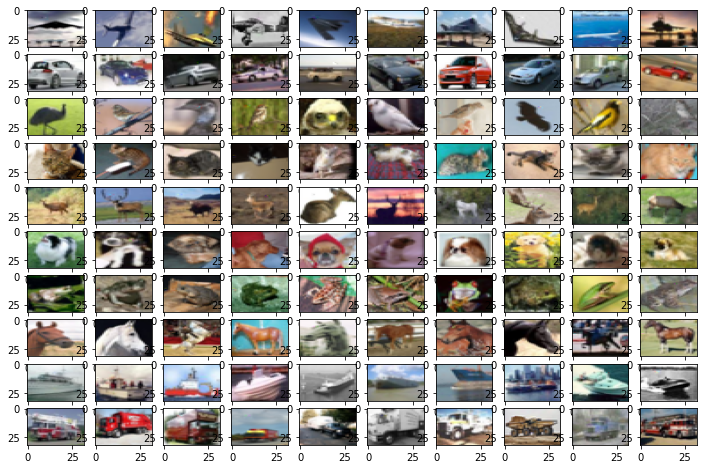

In [ ]:
# visulaize decision attack based perturb subset of test set
print("newtonfool based Perturbed Test Subset Images")
fig, ax = plt.subplots(10, 10, figsize=(12,8))
k = 0
for i in range(10):
    for j in range(10):
        ax[i][j].imshow(x_train_mnist_adv_SquareAttack[k], aspect='auto')
        k += 1
plt.show()

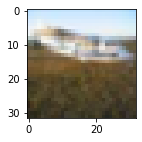

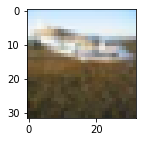

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_train_mnist_adv_SquareAttack[5])

plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])


In [ ]:
ergas_score_x_test_x_test_adv_SquareAttack = ergas(subset_x_test, x_train_mnist_adv_SquareAttack)
mse_score_x_test_x_test_adv_SquareAttack = mse(subset_x_test, x_train_mnist_adv_SquareAttack)

print('ERGAS Score of SquareAttack', ergas_score_x_test_x_test_adv_SquareAttack)
print('MSE Score of SquareAttack', mse_score_x_test_x_test_adv_SquareAttack)

ERGAS Score of SquareAttack 1581.114057825136
MSE Score of SquareAttack 2.735141310889427e-05


/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float64 and float32
  warnings.warn(msg)


#TargetedUniversalPerturbation

In [ ]:
from art.attacks.evasion.targeted_universal_perturbation import TargetedUniversalPerturbation

In [ ]:
up = TargetedUniversalPerturbation(
            victim_classifier, max_iter=1, attacker="fgsm", 
            attacker_params={"eps": 0.3, "targeted": True, "verbose": False}
        )
start = time.time()
x_train_adv_TargetedUniversalPerturbation = up.generate(subset_x_test, y=subset_y_test)

end = time.time()
print ("Time elapsed in seconds to generate SimBA adversarial inputs:", end - start)

# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_train_adv_TargetedUniversalPerturbation), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for SimBA Attack: %.2f%%" % (acc * 100))

print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,preds))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,preds, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,preds, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,preds, average='weighted'))

Time elapsed in seconds to generate SimBA adversarial inputs: 1.3757457733154297

 Accuracy of Classifier on Subset of Test Images for SimBA Attack: 10.00%
accuracy 0.1
precision 0.010309278350515462
recall 0.1
f1-score 0.018691588785046728


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


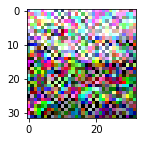

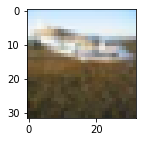

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_train_adv_TargetedUniversalPerturbation[5])

plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])

newtonfool based Perturbed Test Subset Images


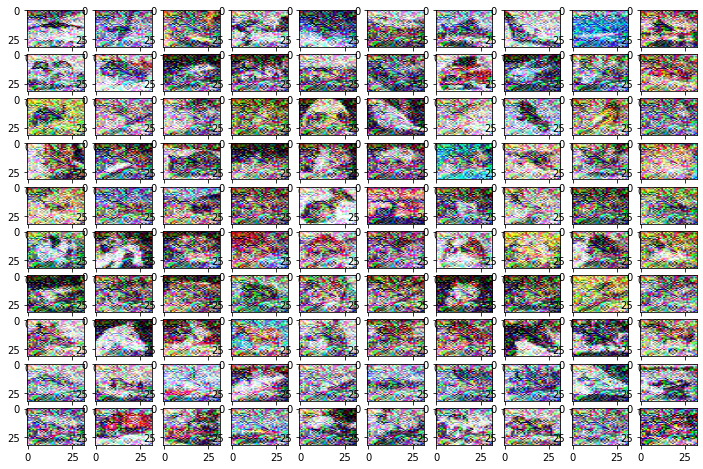

In [ ]:
# visulaize decision attack based perturb subset of test set
print("newtonfool based Perturbed Test Subset Images")
fig, ax = plt.subplots(10, 10, figsize=(12,8))
k = 0
for i in range(10):
    for j in range(10):
        ax[i][j].imshow(x_train_adv_TargetedUniversalPerturbation[k], aspect='auto')
        k += 1
plt.show()

In [ ]:
ergas_score_x_test_x_test_adv_HopSkipJump = ergas(subset_x_test, x_train_adv_TargetedUniversalPerturbation)
mse_score_x_test_x_test_adv_HopSkipJump = mse(subset_x_test, x_train_adv_TargetedUniversalPerturbation)

print('ERGAS Score of newtonfool Attack', ergas_score_x_test_x_test_adv_HopSkipJump)
print('MSE Score of newtonfool Attack', mse_score_x_test_x_test_adv_HopSkipJump)

ERGAS Score of newtonfool Attack 94107.85466528242
MSE Score of newtonfool Attack 0.09163770275943542


UniversalPerturbation


In [ ]:
from art.attacks.evasion.universal_perturbation import  UniversalPerturbation

In [ ]:
up = UniversalPerturbation(
            victim_classifier, max_iter=1, attacker="newtonfool", 
            attacker_params={"max_iter": 5, "verbose": False}, verbose=False
        )
start = time.time()
x_train_adv_UniversalPerturbation = up.generate(subset_x_test)

end = time.time()
print ("Time elapsed in seconds to generate SimBA adversarial inputs:", end - start)

# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_train_adv_UniversalPerturbation), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for SimBA Attack: %.2f%%" % (acc * 100))

print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,preds))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,preds, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,preds, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,preds, average='weighted'))

Time elapsed in seconds to generate SimBA adversarial inputs: 1.7562873363494873

 Accuracy of Classifier on Subset of Test Images for SimBA Attack: 14.00%
accuracy 0.14
precision 0.10353107344632768
recall 0.14
f1-score 0.08598959650749932


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


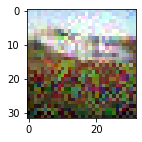

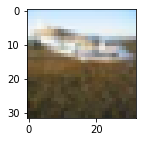

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_train_adv_UniversalPerturbation[5])

plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])

newtonfool based Perturbed Test Subset Images


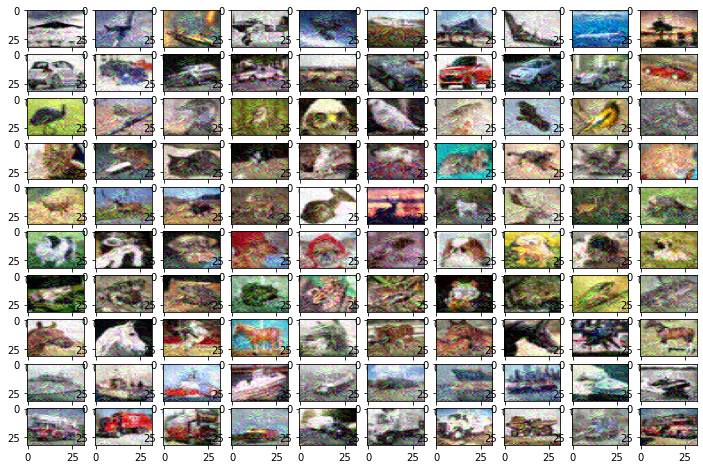

In [ ]:
# visulaize decision attack based perturb subset of test set
print("newtonfool based Perturbed Test Subset Images")
fig, ax = plt.subplots(10, 10, figsize=(12,8))
k = 0
for i in range(10):
    for j in range(10):
        ax[i][j].imshow(x_train_adv_UniversalPerturbation[k], aspect='auto')
        k += 1
plt.show()

In [ ]:
ergas_score_x_test_x_test_adv_HopSkipJump = ergas(subset_x_test, x_train_adv_UniversalPerturbation)
mse_score_x_test_x_test_adv_HopSkipJump = mse(subset_x_test, x_train_adv_UniversalPerturbation)

print('ERGAS Score of newtonfool Attack', ergas_score_x_test_x_test_adv_HopSkipJump)
print('MSE Score of newtonfool Attack', mse_score_x_test_x_test_adv_HopSkipJump)

ERGAS Score of newtonfool Attack 31461.290103648524
MSE Score of newtonfool Attack 0.009809547372633398


VirtualAdversarialMethod

In [ ]:
from art.attacks.evasion.virtual_adversarial import VirtualAdversarialMethod

In [ ]:
df = VirtualAdversarialMethod(victim_classifier, batch_size=100, max_iter=2, verbose=False)
start = time.time()
x_test_adv_VirtualAdversarialMethod = df.generate(subset_x_test)

end = time.time()
print ("Time elapsed in seconds to generate SimBA adversarial inputs:", end - start)

# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_test_adv_VirtualAdversarialMethod), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for SimBA Attack: %.2f%%" % (acc * 100))

print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,preds))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,preds, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,preds, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,preds, average='weighted'))

Time elapsed in seconds to generate SimBA adversarial inputs: 74.42835712432861

 Accuracy of Classifier on Subset of Test Images for SimBA Attack: 96.00%
accuracy 0.96
precision 0.9607070707070707
recall 0.96
f1-score 0.959423558897243


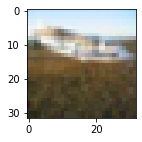

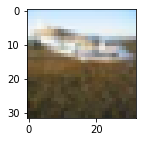

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_test_adv_VirtualAdversarialMethod[5])

plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])


newtonfool based Perturbed Test Subset Images


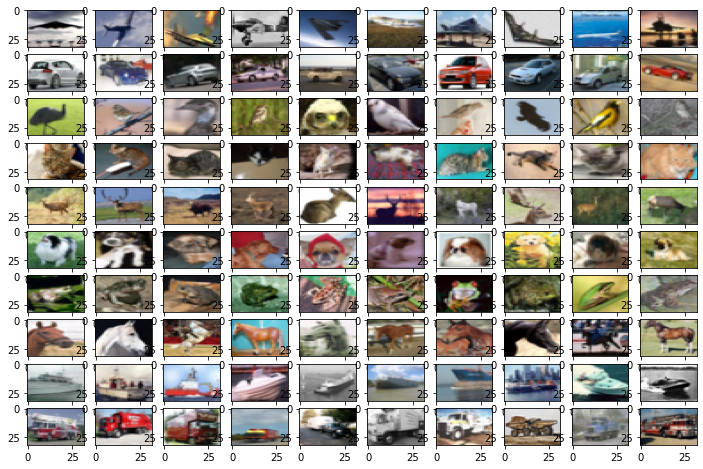

In [ ]:
# visulaize decision attack based perturb subset of test set
print("newtonfool based Perturbed Test Subset Images")
fig, ax = plt.subplots(10, 10, figsize=(12,8))
k = 0
for i in range(10):
    for j in range(10):
        ax[i][j].imshow(x_test_adv_VirtualAdversarialMethod[k], aspect='auto')
        k += 1
plt.show()

In [ ]:

ergas_score_x_test_x_test_adv_HopSkipJump = ergas(subset_x_test, x_test_adv_VirtualAdversarialMethod)
mse_score_x_test_x_test_adv_HopSkipJump = mse(subset_x_test, x_test_adv_VirtualAdversarialMethod)

print('ERGAS Score of newtonfool Attack', ergas_score_x_test_x_test_adv_HopSkipJump)
print('MSE Score of newtonfool Attack', mse_score_x_test_x_test_adv_HopSkipJump)

ERGAS Score of newtonfool Attack 577.2667151548482
MSE Score of newtonfool Attack 3.237732403269386e-06


/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float64 and float32
  warnings.warn(msg)


ZooAttack

In [ ]:
from art.attacks.evasion.zoo import ZooAttack

In [ ]:
zoo = ZooAttack(classifier=victim_classifier, max_iter=1, binary_search_steps=1, learning_rate=0.1, verbose=False)
start = time.time()
x_test_mnist_adv_ZooAttack = zoo.generate(subset_x_test)

end = time.time()
print ("Time elapsed in seconds to generate SimBA adversarial inputs:", end - start)

# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_test_mnist_adv_ZooAttack), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for SimBA Attack: %.2f%%" % (acc * 100))

print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,preds))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,preds, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,preds, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,preds, average='weighted'))

Time elapsed in seconds to generate SimBA adversarial inputs: 278.44578766822815

 Accuracy of Classifier on Subset of Test Images for SimBA Attack: 87.00%
accuracy 0.87
precision 0.8869336219336219
recall 0.87
f1-score 0.8728624591782486


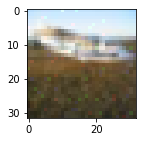

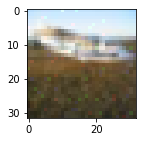

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_test_mnist_adv_ZooAttack[5])

plt.figure(figsize = (2,2))
plt.imshow(x_test_mnist_adv_ZooAttack[5])



newtonfool based Perturbed Test Subset Images


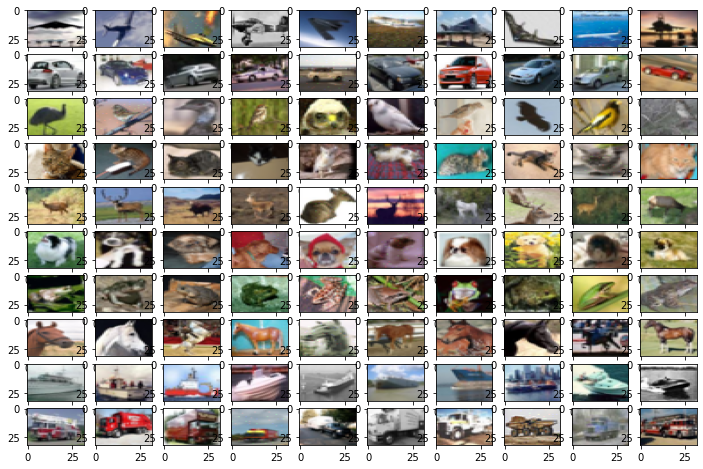

In [ ]:
# visulaize decision attack based perturb subset of test set
print("newtonfool based Perturbed Test Subset Images")
fig, ax = plt.subplots(10, 10, figsize=(12,8))
k = 0
for i in range(10):
    for j in range(10):
        ax[i][j].imshow(x_test_mnist_adv_ZooAttack[k], aspect='auto')
        k += 1
plt.show()

In [ ]:
ergas_score_x_test_x_test_adv_zoo = ergas(subset_x_test, x_test_mnist_adv_ZooAttack)
mse_score_x_test_x_test_adv_zoo = mse(subset_x_test, x_test_mnist_adv_ZooAttack)

print('ERGAS Score of Zoo Attack', ergas_score_x_test_x_test_adv_zoo)
print('MSE Score of Zoo Attack', mse_score_x_test_x_test_adv_zoo)

ERGAS Score of Zoo Attack nan
MSE Score of Zoo Attack 2.5830169002815335e-05


/usr/local/lib/python3.7/dist-packages/sewar/full_ref.py:33: RuntimeWarning: invalid value encountered in sqrt
  rmse_map = np.sqrt(errors)


#ThresholdAttack


In [ ]:
from art.attacks.evasion.pixel_threshold import ThresholdAttack

In [ ]:
pip install cma

In [ ]:
df = ThresholdAttack(victim_classifier, max_iter=1, targeted=True, verbose=False)
start = time.time()
x_test_adv_ThresholdAttack = df.generate(subset_x_test, subset_y_test)
end = time.time()
print ("Time elapsed in seconds to generate x_test_adv_ThresholdAttack adversarial inputs:", end - start)

# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_test_adv_ThresholdAttack), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for x_test_adv_ThresholdAttack Attack: %.2f%%" % (acc * 100))



Time elapsed in seconds to generate x_test_adv_ThresholdAttack adversarial inputs: 481.52102613449097

 Accuracy of Classifier on Subset of Test Images for x_test_adv_ThresholdAttack Attack: 98.00%


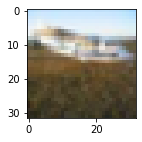

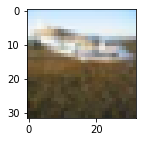

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_test_adv_ThresholdAttack[5])

plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])


newtonfool based Perturbed Test Subset Images


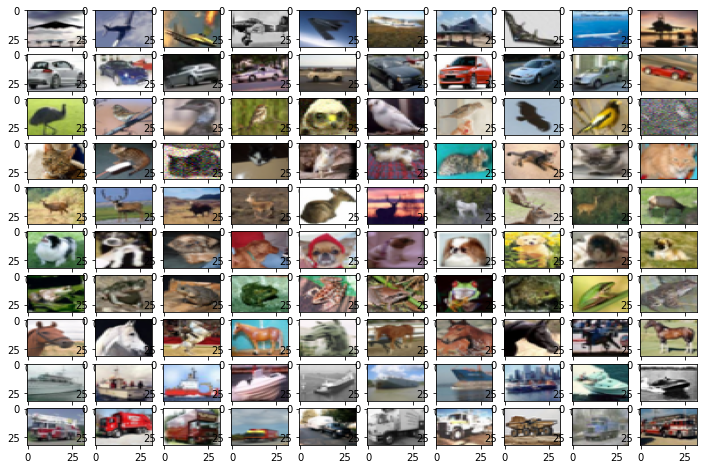

In [ ]:
# visulaize decision attack based perturb subset of test set
print("newtonfool based Perturbed Test Subset Images")
fig, ax = plt.subplots(10, 10, figsize=(12,8))
k = 0
for i in range(10):
    for j in range(10):
        ax[i][j].imshow(x_test_adv_ThresholdAttack[k], aspect='auto')
        k += 1
plt.show()

In [ ]:
ergas_score_x_test_x_test_adv_ThresholdAttack = ergas(subset_x_test, x_test_adv_ThresholdAttack)
mse_score_x_test_x_test_adv_ThresholdAttack = mse(subset_x_test, x_test_adv_ThresholdAttack)

print('ERGAS Score of ThresholdAttack', ergas_score_x_test_x_test_adv_ThresholdAttack)
print('MSE Score of ThresholdAttack', mse_score_x_test_x_test_adv_ThresholdAttack)

ERGAS Score of ThresholdAttack 2118.778144369378
MSE Score of ThresholdAttack 0.00014294263706649246


/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float64 and float32
  warnings.warn(msg)


In [ ]:
ergas_score_x_test_x_test_adv_HopSkipJump = ergas(subset_x_test, x_test_adv_ThresholdAttack)
mse_score_x_test_x_test_adv_HopSkipJump = mse(subset_x_test, x_test_adv_ThresholdAttack)

print('ERGAS Score of newtonfool Attack', ergas_score_x_test_x_test_adv_HopSkipJump)
print('MSE Score of newtonfool Attack', mse_score_x_test_x_test_adv_HopSkipJump)

#AdversarialPatch (targetted attack)

In [ ]:
from art.attacks.evasion import AdversarialPatch

In [ ]:
def bgr_to_rgb(x):
    return x[:, :, ::-1]

In [ ]:
ap = AdversarialPatch(classifier=victim_classifier, max_iter=1,patch_shape=(3, 3, 3))

start = time.time()
patch, patch_mask = ap.generate(x=subset_x_test, y=subset_y_test)
end = time.time()
print ("Time elapsed in seconds to generate adversarialPatch adversarial inputs:", end - start)

Adversarial Patch Numpy:   0%|          | 0/1 [00:00<?, ?it/s]

Time elapsed in seconds to generate adversarialPatch adversarial inputs: 0.3600738048553467


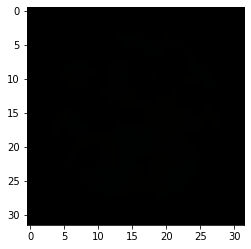

In [ ]:
plt.imshow((bgr_to_rgb(patch) * patch_mask).astype(np.uint8))

In [ ]:
patched_images = ap.apply_patch(subset_x_test, scale=0.5)

In [ ]:
patched_images.shape

(100, 32, 32, 3)

In [ ]:
# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(patched_images), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for AdversarialPatch Attack: %.2f%%" % (acc * 100))


 Accuracy of Classifier on Subset of Test Images for AdversarialPatch Attack: 47.00%


In [ ]:
print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,preds))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,preds, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,preds, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,preds, average='weighted'))

accuracy 0.47
precision 0.5691071428571428
recall 0.47
f1-score 0.46001206636500763


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


AdversarialPatch based Perturbed Test Subset Images


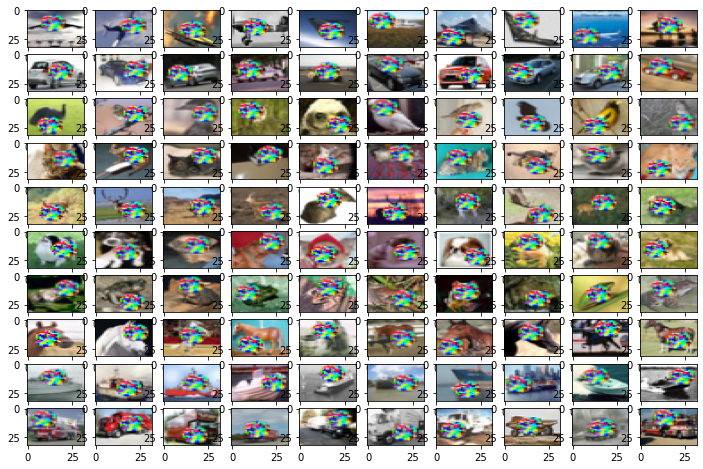

In [ ]:
# visulaize decision attack based perturb subset of test set
print("AdversarialPatch based Perturbed Test Subset Images")
fig, ax = plt.subplots(10, 10, figsize=(12,8))
k = 0
for i in range(10):
    for j in range(10):
        ax[i][j].imshow(patched_images[k], aspect='auto')
        k += 1
plt.show()

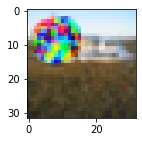

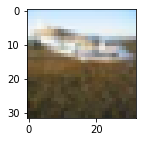

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(patched_images[5])
plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])

In [ ]:
ergas_score_patched_images = ergas(subset_x_test, patched_images)
mse_score_patched_images = mse(subset_x_test, patched_images)

print('ERGAS Score of Adversarial Patch Attack', ergas_score_patched_images)
print('MSE Score of Adversarial Patch Attack', mse_score_patched_images)

ERGAS Score of Adversarial Patch Attack nan
MSE Score of Adversarial Patch Attack 0.024431651528902004


/usr/local/lib/python3.7/dist-packages/sewar/full_ref.py:33: RuntimeWarning: invalid value encountered in sqrt
  rmse_map = np.sqrt(errors)


#CarliniL0Method

In [ ]:
from art.attacks.evasion import CarliniL0Method

In [ ]:
print(len(subset_x_test))

100


In [ ]:
# Carlini attack on subset of test set

adv_crafter_CarliniL0Method = CarliniL0Method(victim_classifier, max_iter=1, verbose=True)
x_sub_test_adv_CarliniL0Method = adv_crafter_CarliniL0Method.generate(x=subset_x_test[:20])

# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_sub_test_adv_CarliniL0Method), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for CarliniL0Method Attack: %.2f%%" % (acc * 100))


 Accuracy of Classifier on Subset of Test Images for CarliniL0Method Attack: 0.00%


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  


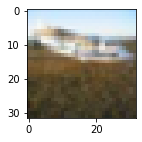

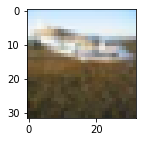

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_sub_test_adv_CarliniL0Method[5])
plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])

In [ ]:
ergas_score_carlini0 = ergas(subset_x_test[:20], x_sub_test_adv_CarliniL0Method)
mse_score_carlini0 = mse(subset_x_test[:20], x_sub_test_adv_CarliniL0Method)

print('ERGAS Score of Carlini0', ergas_score_carlini0)
print('MSE Score of Carlini0', mse_score_carlini0)

ERGAS Score of Carlini0 277.0606158416374
MSE Score of Carlini0 6.862573387625907e-07


/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float64 and float32
  warnings.warn(msg)


#PixelAttack

In [ ]:
from art.attacks.evasion.pixel_threshold import PixelAttack

In [ ]:
df = PixelAttack(victim_classifier, max_iter=1, targeted=True, verbose=False)
start = time.time()
x_test_adv_pixelattack = df.generate(subset_x_test, subset_y_test)
end = time.time()
print ("Time elapsed in seconds to generate newtonfool adversarial inputs:", end - start)

# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_test_adv_pixelattack), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for newtonfool Attack: %.2f%%" % (acc * 100))

print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,preds))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,preds, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,preds, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,preds, average='weighted'))

Time elapsed in seconds to generate newtonfool adversarial inputs: 190.20997405052185

 Accuracy of Classifier on Subset of Test Images for newtonfool Attack: 100.00%
accuracy 1.0
precision 1.0
recall 1.0
f1-score 1.0


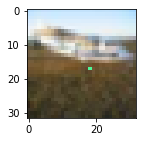

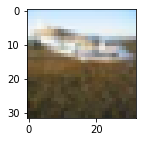

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_test_adv_pixelattack[5])

plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])

In [ ]:

ergas_score_x_test_x_test_adv_HopSkipJump = ergas(subset_x_test, x_test_adv_pixelattack)
mse_score_x_test_x_test_adv_HopSkipJump = mse(subset_x_test, x_test_adv_pixelattack)

print('ERGAS Score of newtonfool Attack', ergas_score_x_test_x_test_adv_HopSkipJump)
print('MSE Score of newtonfool Attack', mse_score_x_test_x_test_adv_HopSkipJump)

ERGAS Score of newtonfool Attack 6680.789519023696
MSE Score of newtonfool Attack 0.0005426460664550849


/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float64 and float32
  warnings.warn(msg)


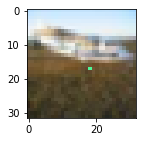

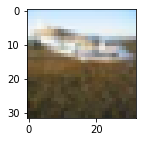

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_test_adv_pixelattack[5])
plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])

#Virtual Adversial 

In [ ]:
from art.attacks.evasion.virtual_adversarial import VirtualAdversarialMethod
df = VirtualAdversarialMethod(victim_classifier, batch_size=100, max_iter=2, verbose=False)
start = time.time()
x_test_adv_VirtualAdversarialMethod = df.generate(subset_x_test)

end = time.time()
print ("Time elapsed in seconds to generate SimBA adversarial inputs:", end - start)

# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_test_adv_VirtualAdversarialMethod), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for SimBA Attack: %.2f%%" % (acc * 100))

print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,preds))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,preds, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,preds, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,preds, average='weighted'))

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_test_adv_VirtualAdversarialMethod[5])

plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])

ergas_score_x_test_x_test_adv_HopSkipJump = ergas(subset_x_test, x_test_adv_VirtualAdversarialMethod)
mse_score_x_test_x_test_adv_HopSkipJump = mse(subset_x_test, x_test_adv_VirtualAdversarialMethod)

print('ERGAS Score of virtual Attack', ergas_score_x_test_x_test_adv_HopSkipJump)
print('MSE Score of virtual Attack', mse_score_x_test_x_test_adv_HopSkipJump)

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_test_adv_VirtualAdversarialMethod[5])
plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])

#Zoo Attack

In [ ]:
zoo = ZooAttack(classifier=victim_classifier, max_iter=1, binary_search_steps=1, learning_rate=0.1, verbose=False)
start = time.time()
x_test_mnist_adv_ZooAttack = zoo.generate(subset_x_test)

end = time.time()
print ("Time elapsed in seconds to generate SimBA adversarial inputs:", end - start)

# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_test_mnist_adv_ZooAttack), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for SimBA Attack: %.2f%%" % (acc * 100))

print('accuracy',sklearn.metrics.accuracy_score(dependent_maxvalue,preds))
print('precision',sklearn.metrics.precision_score(dependent_maxvalue,preds, average='weighted'))
print('recall',sklearn.metrics.recall_score(dependent_maxvalue,preds, average='weighted'))
print('f1-score',sklearn.metrics.f1_score(dependent_maxvalue,preds, average='weighted'))

In [ ]:
ergas_score_x_test_x_test_adv_HopSkipJump = ergas(subset_x_test, x_test_mnist_adv_ZooAttack)
mse_score_x_test_x_test_adv_HopSkipJump = mse(subset_x_test, x_test_mnist_adv_ZooAttack)

print('ERGAS Score of Zoo Attack', ergas_score_x_test_x_test_adv_HopSkipJump)
print('MSE Score of Zoo Attack', mse_score_x_test_x_test_adv_HopSkipJump)

In [ ]:
plt.figure(figsize = (2,2))
plt.imshow(x_test_mnist_adv_ZooAttack[5])
plt.figure(figsize = (2,2))
plt.imshow(subset_x_test[5])

#MalwareGDTensorFlow

In [ ]:
from art.attacks.evasion import MalwareGDTensorFlow

In [ ]:
nf = MalwareGDTensorFlow(victim_classifier, max_iter=5, verbose=False)
start = time.time()
x_test_adv_NewtonFool = nf.generate(subset_x_test)
end = time.time()
print ("Time elapsed in seconds to generate newtonfool adversarial inputs:", end - start)


# Evaluate the classifier on the adversarial examples
preds = np.argmax(victim_classifier.predict(x_test_adv_NewtonFool), axis=1)
acc = np.sum(preds == np.argmax(subset_y_test, axis=1)) / subset_y_test.shape[0]
print("\n Accuracy of Classifier on Subset of Test Images for newtonfool Attack: %.2f%%" % (acc * 100))

TypeError: ignored

#Errors

In [ ]:
#DecisionTreeAttack

In [ ]:
#AutoProjectedGradientDescent

In [ ]:
#Auto Attack

In [ ]:
#Dpatch

In [ ]:
#HighConfidenceLowUncertanity